In [ ]:
import cv2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
image = cv2.imread('/content/drive/MyDrive/Data science/Computer Vision Masterclass/Images/people1.jpg')

In [ ]:
image.shape

(1280, 1920, 3)

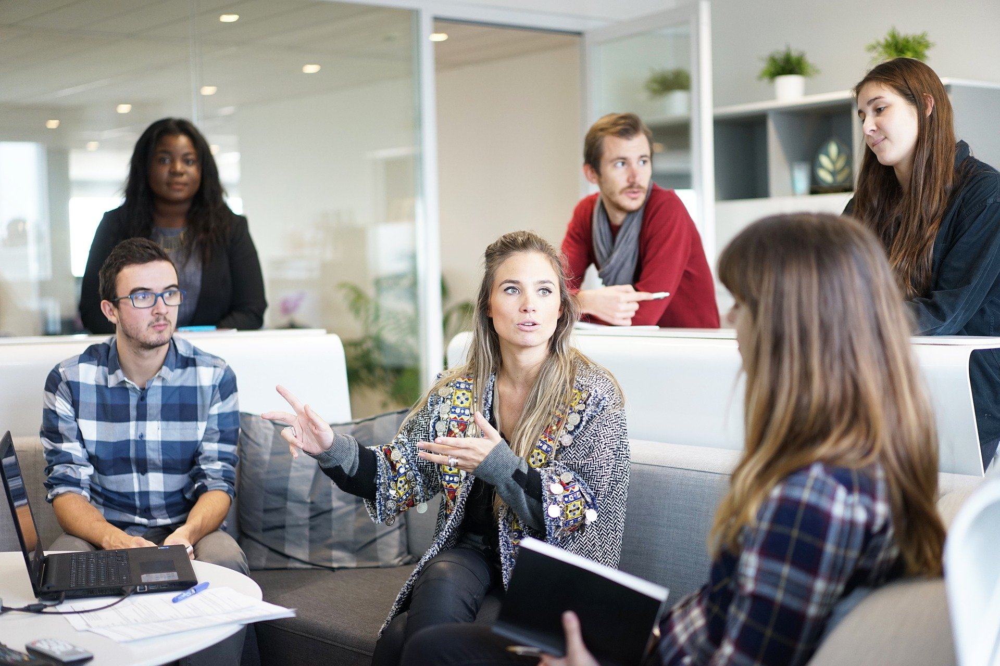

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(image)

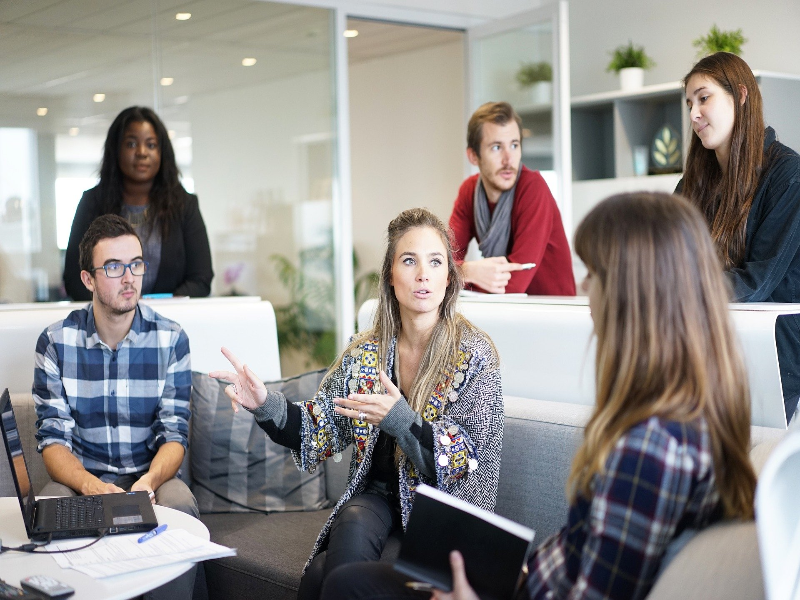

In [ ]:
image = cv2.resize(image, (800, 600))
cv2_imshow(image)

In [ ]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #converting image to grayscale as its better for harcasscade calssifier

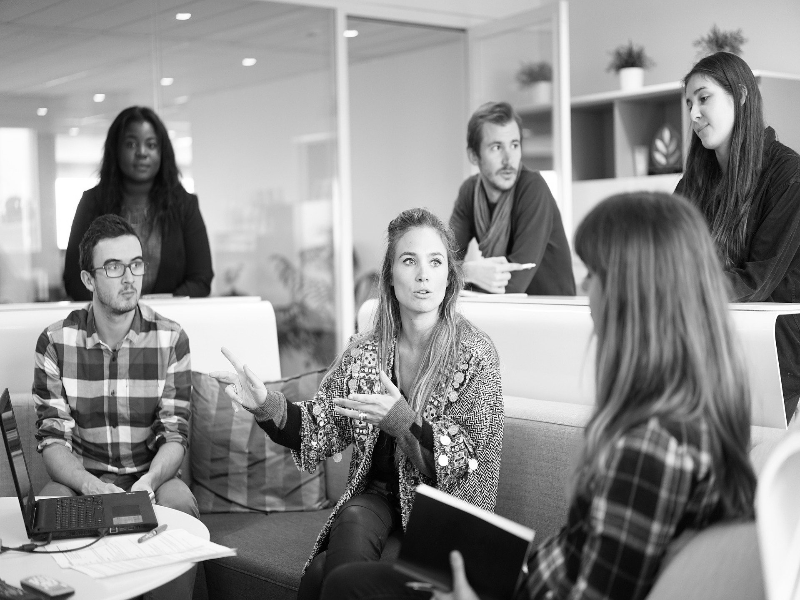

In [ ]:
cv2_imshow(image_gray) 

In [ ]:
# in order to detect face, we first create an object:
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Data science/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')

In [ ]:
detections = face_detector.detectMultiScale(image_gray)

In [ ]:
detections

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

first two entries in the array give (x,y) coordinates for face detected and
the next two entries give size of the face detected

In [ ]:
len(detections)  # give the number of detections

6

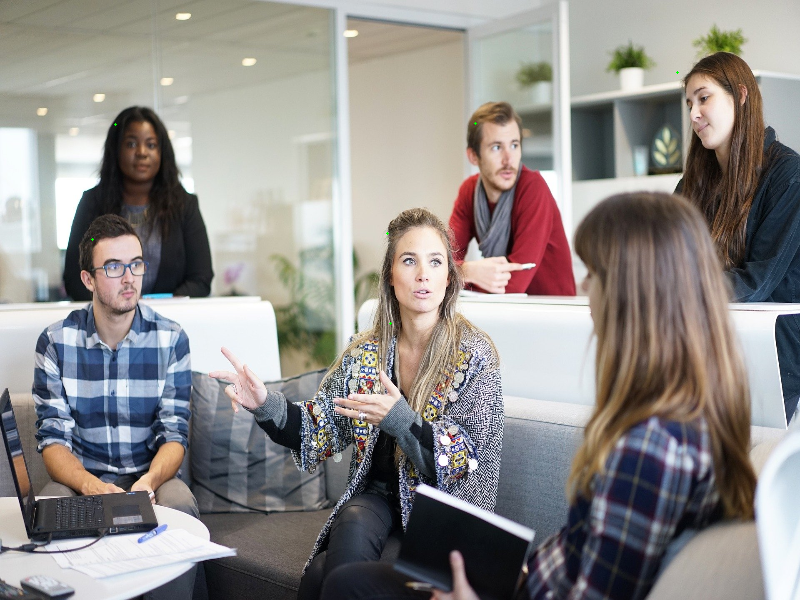

In [ ]:
# to get starting points of these images
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x, y), (0, 255, 0), 2)
cv2_imshow(image)

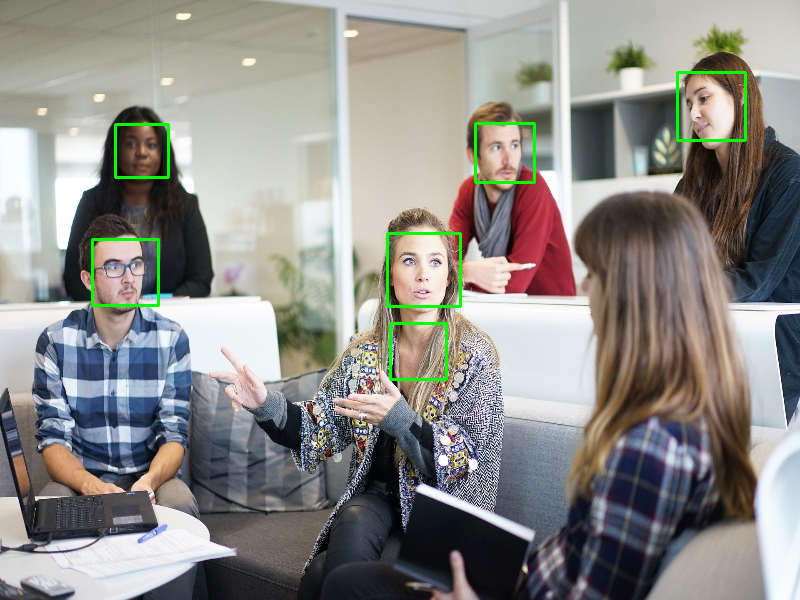

In [ ]:
# now to draw rectangles on the faces:
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)
cv2_imshow(image)

cv2.rectangle(filename, (pt1, pt2), (imgsize(x), imagesize(y)), color, thickness)

*** as seen that there is a flase positive aroyund the woman's neck.

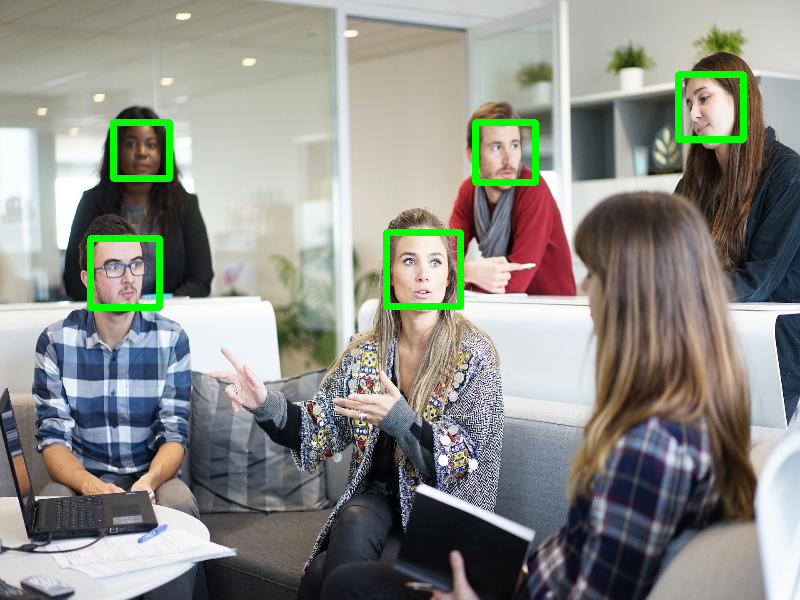

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Data science/Computer Vision Masterclass/Images/people1.jpg')
image = cv2.resize(image, (800, 600))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.09)
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 5)
cv2_imshow(image)

keep testing the values of scaleFactor in order to get the best value

larger the faces, greater the face value

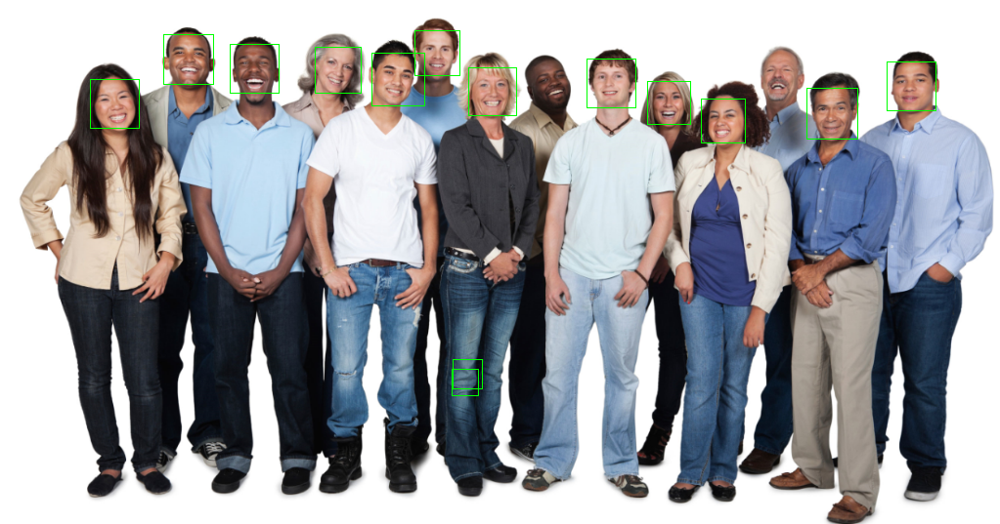

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Data science/Computer Vision Masterclass/Images/people2.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray)
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 1)
cv2_imshow(image)

47 47
47 47
49 49
49 49
44 44
51 51
52 52
51 51
50 50
47 47
51 51
47 47


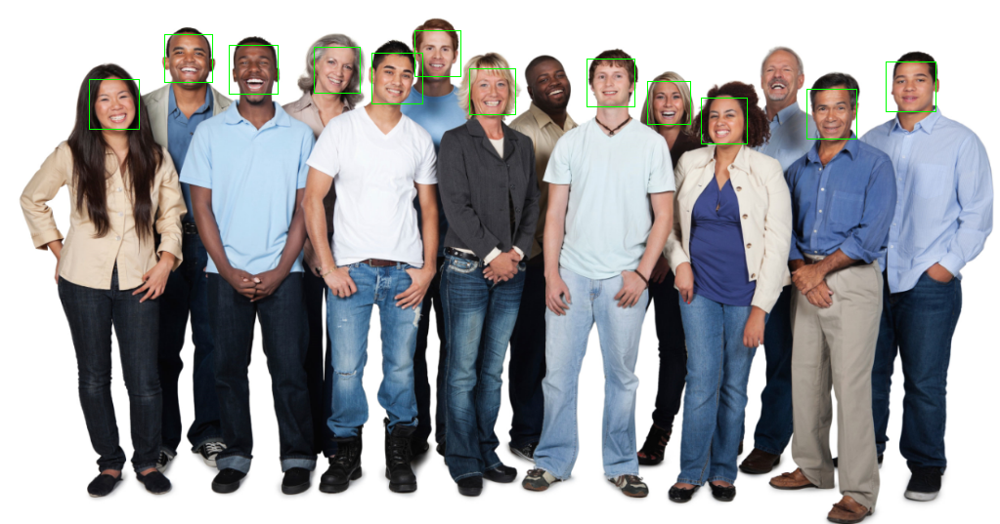

In [ ]:
# for the same imge using harrcascade parameters to increse the accuracy:
image = cv2.imread('/content/drive/MyDrive/Data science/Computer Vision Masterclass/Images/people2.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.2, minNeighbors = 7,
                                            minSize = (30, 30), maxSize = (60, 60))
for (x, y, w, h) in detections:
  print(w, h)
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 1)
cv2_imshow(image)

# Eye Detection

In [ ]:
eye_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Data science/Computer Vision Masterclass/Cascades/haarcascade_eye.xml')

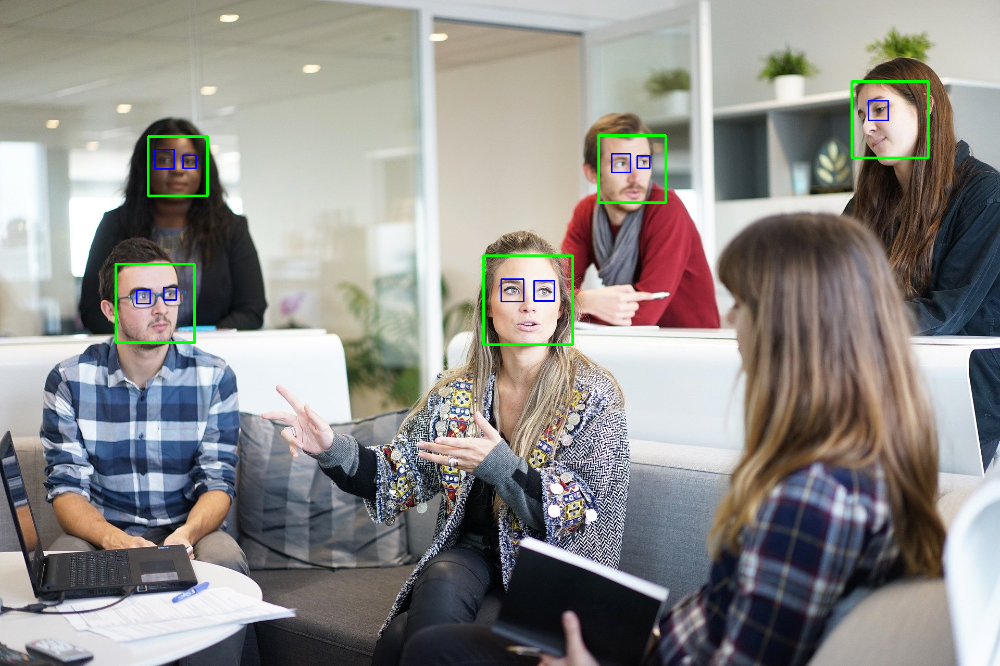

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Data science/Computer Vision Masterclass/Images/people1.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
face_detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.3, minSize = (30, 30))
eye_detections = eye_detector.detectMultiScale(image_gray, scaleFactor = 1.1, minNeighbors = 10, maxSize = (70, 70))
for (x, y, w, h) in face_detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 4)
for (x, y, w, h) in eye_detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 0), 2)
cv2_imshow(image)